In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
from google.colab.output import eval_js
def shrink(height="300"):
    eval_js(f'google.colab.output.setIframeHeight({height})')

Get the data - only need to run once

In [3]:
numpy_data_path = "/content/drive/MyDrive/numpy_images"

Set up environment

In [4]:
! pip install --upgrade pip
! pip install torch torchvision torchsummary gca pandas numpy matplotlib seaborn scikit-learn==0.23.2 pycocotools tqdm umap-learn kneed
! pip install git+https://github.com/waleedka/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI
# TODO: install the docem python package via github
! pip list
shrink()

     |████████████████████████████████| 1.6 MB 6.9 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
     |████████████████████████████████| 6.8 MB 7.5 MB/s 
     |████████████████████████████████| 80 kB 13.0 MB/s 
     |████████████████████████████████| 1.1 MB 48.7 MB/s 
  Created wheel for gca: filename=gca-0.1-py3-none-any.whl size=12304 sha256=39d14d0a670fb82466563fb7d343d04c625e484ee79c76693655e869cce96095
  Stored in directory: /root/.cache/pip/wheels/68/85/d1/f5ac3c697ed91a030ee4b8b4055ebc9f4335b6185f9064609a
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76566 sha256=63dbd2a606161406f700adf4736ce3258905fcb62bfeae16ee701f8d3bc9d17b
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52372 sha256=32f4c4cbb57e78ca87a

Choose a GPU runtime

In [5]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
    
device

0
1
Tesla T4


device(type='cuda', index=0)

In [6]:
import os
import multiprocessing as mp
import random
import sys

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import torch 
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

In [8]:
!wget https://cs7643-raml.s3.us-west-2.amazonaws.com/embeddings/val_img_emb.pkl

--2021-08-02 19:53:47--  https://cs7643-raml.s3.us-west-2.amazonaws.com/embeddings/val_img_emb.pkl
Resolving cs7643-raml.s3.us-west-2.amazonaws.com (cs7643-raml.s3.us-west-2.amazonaws.com)... 52.218.221.161
Connecting to cs7643-raml.s3.us-west-2.amazonaws.com (cs7643-raml.s3.us-west-2.amazonaws.com)|52.218.221.161|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 48618715 (46M) [application/x-www-form-urlencoded]
Saving to: ‘val_img_emb.pkl’

val_img_emb.pkl     100%[===================>]  46.37M  53.2MB/s    in 0.9s    

2021-08-02 19:53:48 (53.2 MB/s) - ‘val_img_emb.pkl’ saved [48618715/48618715]



In [12]:
import pickle

In [15]:
import os
import json
print(os.getcwd())

os.chdir("/content/drive/MyDrive/numpy_images/")
print(os.listdir())

embeddings_path = "val_img_emb.pkl"
mapping_path = "id_imagecocoid_mapping.npy"
#embeddings = torch.load(embeddings_path,map_location=torch.device('cpu'))

with open(embeddings_path, 'rb') as f:
    embeddings = pickle.load(f)

idx2Img = np.load(mapping_path,allow_pickle='TRUE').item()        
#with open(mapping_path, 'r') as fp:
#    idx2Img = json.load(fp)
    
idx2Img = dict(zip(list(map(int, idx2Img.keys())), list(idx2Img.values())))
print(idx2Img)



/content/drive/My Drive/numpy_images
['data', 'annotations', 'resnext_embeddings.json', 'resnext_embeddings.pt', 'di_index2cocoIDs.json', 'di_embed_val_batch_41.pt', 'faiss.ipynb', 'id_imagecocoid_mapping.npy', 'val_img_emb.pkl']
{0: 443167, 1: 468483, 2: 27696, 3: 98283, 4: 299553, 5: 394288, 6: 260802, 7: 559388, 8: 117508, 9: 275058, 10: 360705, 11: 69021, 12: 326667, 13: 517973, 14: 129945, 15: 417608, 16: 84889, 17: 237326, 18: 387328, 19: 547858, 20: 117891, 21: 114891, 22: 448779, 23: 9145, 24: 29465, 25: 123642, 26: 487469, 27: 499093, 28: 230262, 29: 338256, 30: 389197, 31: 47686, 32: 274917, 33: 309044, 34: 519182, 35: 74030, 36: 140797, 37: 351557, 38: 15079, 39: 301762, 40: 291664, 41: 374041, 42: 343937, 43: 350959, 44: 325328, 45: 26671, 46: 289938, 47: 354398, 48: 457817, 49: 214720, 50: 218017, 51: 368581, 52: 6033, 53: 324189, 54: 26617, 55: 191360, 56: 226973, 57: 566038, 58: 111325, 59: 208663, 60: 283222, 61: 444543, 62: 136212, 63: 457249, 64: 393857, 65: 556545, 6

In [27]:

reverse_idx2Img = {v:k for k,v in idx2Img.items()}

In [16]:
# Img Ids to query
random.seed(10)
#TODO: Madhuri
#Commenting this out so that same images (as in Michael's) can be used for results
#query_images = random.sample(list(idx2Img.values()), 10)
query_images = [558661, 123071, 535156, 185614, 8493, 538859, 10583, 254976, 176847, 369594]
print(query_images)
# Position of query images in embedding space
query_idxs = [key for key, value in idx2Img.items() if idx2Img[key] in query_images]

print("query image ids: ", query_images)
print("query image idxs: ", query_idxs)

[558661, 123071, 535156, 185614, 8493, 538859, 10583, 254976, 176847, 369594]
query image ids:  [558661, 123071, 535156, 185614, 8493, 538859, 10583, 254976, 176847, 369594]
query image idxs:  [2310, 3666, 3901, 6973, 7874, 10954, 15886, 15929, 19099, 19227]


In [17]:

# Update based on the location in your system
annot_file = "annotations/instances_val2014.json"


In [18]:
!pip install faiss-gpu

     |████████████████████████████████| 89.7 MB 15 kB/s 


In [21]:
print(embeddings)
#em_np = embeddings.cpu().numpy()
#print(type(em_np))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [60]:
query_embedding = []
for i in [558661, 123071, 535156, 185614, 8493, 538859, 10583, 254976, 176847, 369594]:
  id_ = reverse_idx2Img[i]
  query_embedding.append(embeddings[id_])
#query_embedding = reverse_idx2Img[query_idxs]
#print(query_embedding.shape)
print(len(query_embedding))
query_embedding = np.array(query_embedding, dtype=np.float32)
print(query_embedding.shape)

10
(10, 256)


In [54]:
em = []
for key, value in embeddings.items():
  em.append(value)
em_np = np.array(em, dtype=np.float32)  
print(em_np.shape)

(21002, 256)


In [55]:
import faiss
index = faiss.IndexFlatL2(256)   # build the index
print(index.is_trained)
index.train(em_np)
index.add(em_np)                  # add vectors to the index
print(index.ntotal)

True
21002


In [56]:
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import numpy as np
import itertools
from pycocotools.coco import COCO
from mpl_toolkits.mplot3d import Axes3D
from collections import Counter
import pandas as pd

class EmbeddingPlotter:
    def __init__(self, annot_file, embeddings, idx2Img):
        self.annot_file = annot_file
        self.coco = COCO(self.annot_file)
        cats = self.coco.loadCats(self.coco.getCatIds())
        self.cat_id_to_name_dict = {cat['id']: cat['name'] for cat in cats}
        self.img_ids = list(idx2Img.values())
        self.annIds = self.coco.getAnnIds(self.img_ids)
        #self.labels = [self.coco.loadAnns(self.annIds)]
        
        
        
        
        self.embeddings = embeddings
        self.idx2Img = idx2Img
        self.labels = []
        for k, v in self.idx2Img.items():
            ann_ids_to_append = self.coco.getAnnIds(self.idx2Img[k])
            anns_to_append = self.coco.loadAnns(ann_ids_to_append)
            self.labels.append(anns_to_append)
            
        
        self.category_labels=[]
        # self.category_multi_labels = []
        # self.category_multi_labels_counts = []
        self.supercategory_labels = []
        # self.supercategory_multi_labels = []
        # self.supercategory_multi_labels_counts = []
        
        
 
        
        cats_dict = {cat['id']: cat for cat in cats}
        for label in self.labels:
            
            if len(label) > 0:
                categories = []
                supercategories = []
                
                for annotation in label:
                    categories.append(cats_dict[annotation['category_id']]['name'])
                    supercategories.append(cats_dict[annotation['category_id']]['supercategory'])
                # self.category_multi_labels_counts.append(categories)
                # self.category_multi_labels.append(list(set(categories)))
                # self.supercategory_multi_labels.append(list(set(supercategories)))
                # self.supercategory_multi_labels_counts.append(supercategories)
        
                # most common category among objects in the picture
                category, _ = Counter(categories).most_common(1)[0]
                supercategory, _ = Counter(supercategories).most_common(1)[0]
                
                self.category_labels.append(category)
                self.supercategory_labels.append(supercategory)
            else:
                # self.supercategory_multi_labels.append([])
                # self.supercategory_multi_labels_counts.append([])
                # self.category_multi_labels.append([])
                # self.category_multi_labels_counts.append([])
                self.category_labels.append(None)
                self.supercategory_labels.append(None)
        
    def plot_coco_images(self, img_ids, show_labels=True,
                         show_annotations=False, title_suffix=None, figtitle=None):
        coco = self.coco
        cat_id_to_name_dict = self.cat_id_to_name_dict
        nrows = len(img_ids)
        ncols = len(img_ids[0])
    
        fig = plt.figure(figsize=(ncols*6, nrows*6))
    
        for i, img_id in enumerate(itertools.chain(*img_ids)):
            ax = fig.add_subplot(nrows, ncols, i+1)
            img = coco.loadImgs(img_id)[0]
            I = io.imread(img['coco_url'])
    
            ax.imshow(I, aspect='equal', )
            ax.axis('off')
            
            if title_suffix is not None:
                title=f'{img_id}: {title_suffix[i//nrows, i%ncols]}'
            else:
                title = str(img_id)
            ax.set_title(title)
    
        
            annIds = coco.getAnnIds(imgIds=img['id'], iscrowd=None)
            anns = coco.loadAnns(annIds)
            if show_annotations:
                coco.showAnns(anns)
    
            if show_labels:
                for ann in anns:
                    [x, y, _, _] = ann['bbox']
                    label = cat_id_to_name_dict[ann['category_id']]
    
                    t=ax.annotate(label, (x,y), fontsize=12)
                    t.set_bbox(dict(facecolor='white', alpha=0.2, edgecolor='white'))
    
        plt.tight_layout()
        
        if figtitle:
            fig.suptitle(figtitle)
            plt.subplots_adjust(top=0.90)
        plt.show()
        
    def plot_neighbors(self, X_idx, nbrs, show_annotations=False):
        idx2Img = self.idx2Img
        embeddings = self.embeddings
        m, n = np.shape(embeddings)
        img_id = idx2Img[X_idx]
        
        distances, indices = nbrs.kneighbors(embeddings[X_idx, :].reshape(1, n), 16)
        distances, indices = distances[0], indices[0]
        neighbors_ids = np.array(list(map(idx2Img.get, indices)))
        np.insert(neighbors_ids, 0, img_id)
        np.insert(distances, 0, 0)
        
        title_suffix = np.array([f'distance={distance:.2f}' for distance in distances])
        figtitle=f'Neighbors of {img_id}'
        self.plot_coco_images(neighbors_ids.reshape(4, 4).tolist(), 
                         title_suffix=title_suffix.reshape(4,4),
                         show_annotations=show_annotations,
                         figtitle=figtitle)
        
    def plot_3d(self, X, title=None, columns=['x0', 'x1', 'x2'], **kwargs):
        labels = self.supercategory_labels
        
        
        
        df = pd.DataFrame(X, columns=columns)
        df['label'] = labels
        cmap = plt.get_cmap('gist_rainbow')
        unique_labels = list(set(labels))
        labels_dict = {label: i for i, label in enumerate(unique_labels)}
        num_colors = len(unique_labels)
        c = [cmap(1.*labels_dict[label]/num_colors) for label in labels]
    
        df['c'] = c
        df = df[~df['label'].isna()]
        ax = plt.figure(figsize=(16,10)).gca(projection='3d')
        
        for label, grp in df.groupby('label'):
            ax.scatter(
            xs=grp[columns[0]], 
            ys=grp[columns[1]], 
            zs=grp[columns[2]], 
            c=grp['c'], 
            label=label,
            **kwargs
        #     cmap='gist_rainbow'
        )
        
        ax.set_xlabel(columns[0])
        ax.set_ylabel(columns[1])
        ax.set_zlabel(columns[2])
        
        plt.legend(loc='best')
        if title:
            plt.title(title)
        plt.show()

In [57]:
plotter = EmbeddingPlotter(annot_file = annot_file, embeddings=embeddings, idx2Img=idx2Img)

loading annotations into memory...
Done (t=6.31s)
creating index...
index created!


In [61]:
k = 6                         # we want to see 5 nearest neighbors
D, I = index.search(query_embedding, k) # sanity check
print(I)
print(D)

[[ 3901 20803  2893  4109   585 20241]
 [10954  1055   907 17044 20736 20029]
 [ 6973  8217  7582 16431 20155 12365]
 [ 3666 11271  8318  6302 16767 18450]
 [15886  5468 17283 10009  1235  8199]
 [19227  9929   802 13820  2366 15308]
 [ 7874 12843 10572 17864  2828 20138]
 [15929 20340 17142 19027  3398  9964]
 [19099  8639 14790 17343 15483  4509]
 [ 2310  3838  3824  6921 11680 13785]]
[[ 0.       72.49909  74.439095 75.6748   78.51419  79.33425 ]
 [ 0.       39.08737  39.11994  42.261745 42.407234 42.63067 ]
 [ 0.       25.546032 28.248186 33.70198  34.992085 35.628452]
 [ 0.       69.50034  69.87208  76.79873  80.80327  84.31483 ]
 [ 0.       74.20579  74.41878  78.98621  79.19425  82.15449 ]
 [ 0.       45.49206  46.21272  48.81796  49.245007 49.590958]
 [ 0.       22.074938 24.013636 25.034187 25.506878 25.861925]
 [ 0.       54.506306 57.12657  57.29462  57.841858 62.127743]
 [ 0.       38.11344  40.173603 42.489162 42.62449  46.96814 ]
 [ 0.       20.758259 27.979887 30.563227 

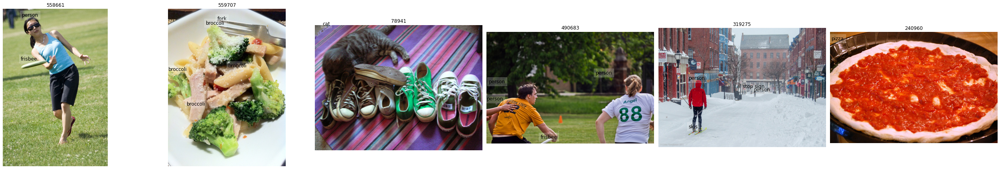

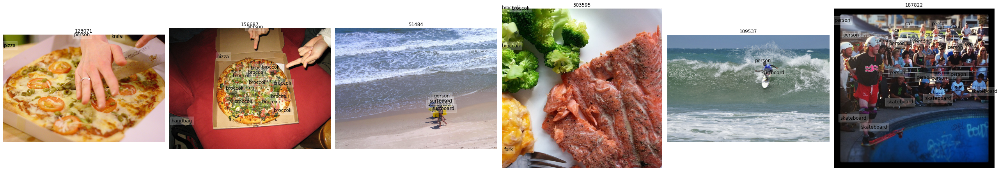

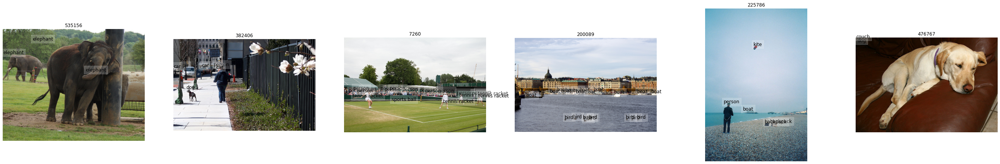

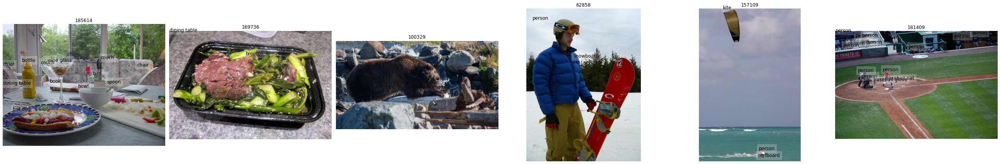

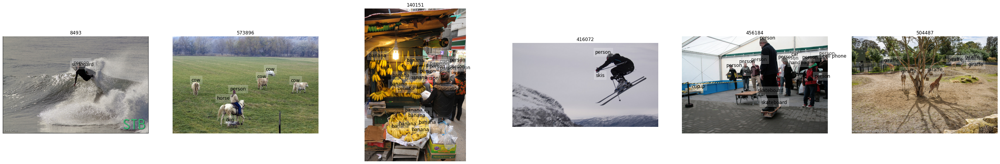

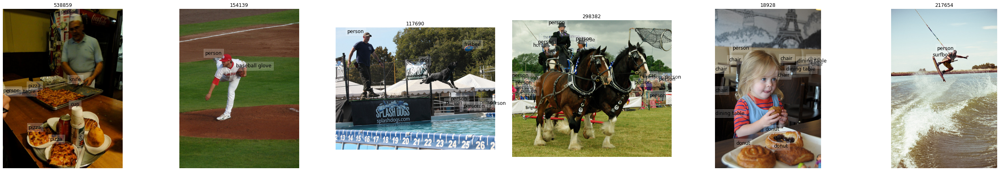

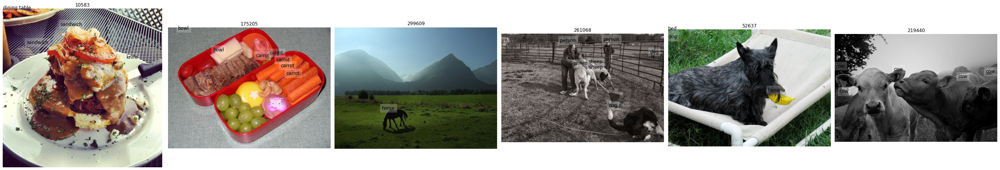

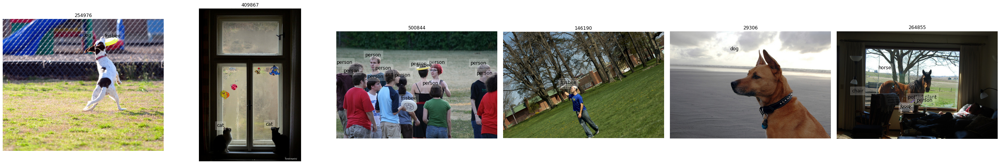

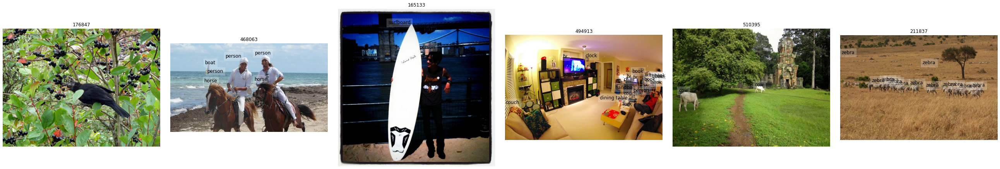

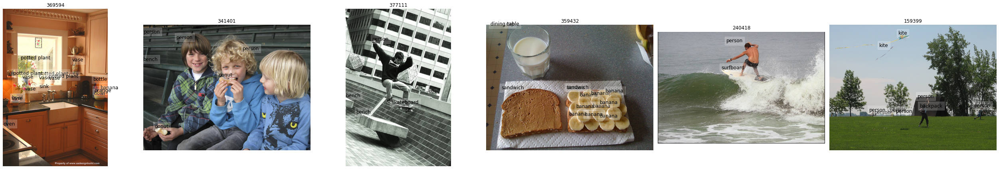

In [62]:
for j in range(I.shape[0]):
  l = []
  for i in range(I.shape[1]):
    l.append(idx2Img[I[j][i]])
  plotter.plot_coco_images([l])
